
# Car Detector and Classifier


## Table of Contents

1. [Introduction](#intro)
2. [Import Libraries](#import)
3. [Load Object Detection Model](#model)
4. [Define Functions](#functions)
5. [Test Single Dash Cam Image](#test)
6. [Detection Model Performance on all Test Data](#BigTest)
7. [Classify a Single Car Image](#Car)
8. [Putting it all Together](#Together)
9. [Summary](#Summary)


## Introduction<a name = 'intro'>
    
    High performing object detector models are typically trained on very large sets of data and with limited classes. The purpose of this project is to expand the flexibility of an object detection model by detecting an object of interest (in this case a car),cropping the object out of the larger image, and finally feeding the cropped image to a purpose built image classifier. In essence exapanding the number of classes an already trained object detector has.
    
    First, an object detection model with pretained weights is loaded. Then the model is tested on a data set of dash cam images. Next, detected images of cars are cropped and fed into a pretrained image classifier. Finally, the original dash cam image is displayed with bounding boxes and labels of the predicted type of car.


## Import Libraries<a name='import'>

In [133]:
import torch

from PIL import Image, ImageDraw, ImageFont
import colorsys
import random

import imghdr
from keras import backend as K

import numpy as np

import tarfile
import cv2
%matplotlib inline
import matplotlib.pylab as pt
import matplotlib.pyplot as plt
import os



## Load Object Detection Model<a name='model'>

The detection model is the YOLO v5. Documentation can be found at https://github.com/ultralytics/yolov5

Model architecture and pretrained weights are utilized

The model is adjusted so only the class of interest is returned. In this case cars.

In [2]:


# Model
model = torch.hub.load('ultralytics/yolov5', 'yolov5s', pretrained=True)



Using cache found in C:\Users\krsim/.cache\torch\hub\ultralytics_yolov5_master
requirements: pandas>=1.1.4 not found and is required by YOLOv5, attempting auto-update...
requirements: Command 'pip install 'pandas>=1.1.4'' returned non-zero exit status 1.
YOLOv5  2022-4-22 torch 1.8.1+cpu CPU

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients
Adding AutoShape... 



## Define Functions<a name='functions'>

These functions process the outputs of the detection model 

In [172]:
def get_boxes(preds):
    boxes = []
    for pred in preds:
        box = [pred[1], pred[0], pred[3], pred[2]]
        boxes.append(box)
        
    return(np.array(boxes, dtype = 'uint32'))

def get_box_classes(preds):
    box_classes = []
    for pred in preds:
        box_classes.append(pred[-1])
    classes = np.array(box_classes, dtype = 'uint8')  
    return classes

def read_classes(classes_path):
    with open(classes_path) as f:
        class_names = f.readlines()
    class_names = [c.strip() for c in class_names]
    return class_names

def read_anchors(anchors_path):
    with open(anchors_path) as f:
        anchors = f.readline()
        anchors = [float(x) for x in anchors.split(',')]
        anchors = np.array(anchors).reshape(-1, 2)
    return anchors

def get_colors_for_classes(num_classes):
    """Return list of random colors for number of classes given."""
    # Use previously generated colors if num_classes is the same.
    if (hasattr(get_colors_for_classes, "colors") and
            len(get_colors_for_classes.colors) == num_classes):
        return get_colors_for_classes.colors

    hsv_tuples = [(x / num_classes, 1., 1.) for x in range(num_classes)]
    colors = list(map(lambda x: colorsys.hsv_to_rgb(*x), hsv_tuples))
    colors = list(
        map(lambda x: (int(x[0] * 255), int(x[1] * 255), int(x[2] * 255)),
            colors))
    random.seed(10101)  # Fixed seed for consistent colors across runs.
    random.shuffle(colors)  # Shuffle colors to decorrelate adjacent classes.
    random.seed(None)  # Reset seed to default.
    get_colors_for_classes.colors = colors  # Save colors for future calls.
    return colors


def draw_boxes(image, boxes, box_classes, class_names, label = "NA", limit_classes = None, scores=None):
    """Draw bounding boxes on image.

    Draw bounding boxes with class name and optional box score on image.

    Args:
        image: An `array` of shape (width, height, 3) with values in [0, 1].
        boxes: An `array` of shape (num_boxes, 4) containing box corners as
            (y_min, x_min, y_max, x_max).
        box_classes: A `list` of indicies into `class_names`.
        class_names: A `list` of `string` class names.
        limit_classes: A `list` of class indices. The function will only out boxes for these classes.
        `scores`: A `list` of scores for each box.

    Returns:
        A copy of `image` modified with given bounding boxes.
    """
    image = Image.fromarray(image)#np.floor(image * 255 + 0.5).astype('uint8'))
    
    #font = ImageFont.load("E:\\A2D2/AovelSansRounded-rdDL.ttf")
    #font = ImageFont.truetype(15)
    thickness = (image.size[0] + image.size[1]) // 400

    colors = get_colors_for_classes(len(class_names))
    
    classes_to_box = [] 
    
    if limit_classes == None:
        classes_to_box = box_classes
    else:
        classes_to_box = limit_classes

    for i, c in list(enumerate(box_classes)):
        box_class = class_names[c]
        if c in classes_to_box:
            box = boxes[i]
            #if isinstance(scores, np.ndarray):
            #    score = scores[i]
            #    label = '{} {:.2f}'.format(box_class, score)
            #else:
            #    label = '{}'.format(box_class)

            label = label
            draw = ImageDraw.Draw(image)
            label_size = draw.textsize(label)#, font)

            top, left, bottom, right = box
            top = max(0, np.floor(top + 0.5).astype('int32'))
            ##left = max(0, np.floor(left + 0.5).astype('int32'))
            #bottom = min(image.size[1], np.floor(bottom + 0.5).astype('int32'))
            #right = min(image.size[0], np.floor(right + 0.5).astype('int32'))
            print(label, (left, top), (right, bottom))
            
            if top - label_size[1] >= 0:
                text_origin =np.array([left, top - label_size[1]])
            else:
                text_origin = np.array((left, top + 1))

            
            for i in range(thickness):
                draw.rectangle(
                    [left + i, top + i, right - i, bottom - i], outline=colors[c])
            draw.rectangle(
                [tuple(text_origin), tuple(text_origin + label_size)],
                fill=colors[c])
            draw.text(tuple(text_origin), label )#, font=font)
            del draw

    return np.array(image)



In [4]:
class_names = read_classes('E:\\A2D2/coco_c.txt')
anchors = read_anchors("E:\\A2D2/yolo_anchors.txt")
model_image_size = (608, 608)



## Test a Dash Cam Image<a name='test'>
    
    A single image from the A2D2 data set is put into the YOLO model.

In [96]:
dash_cam_files = os.listdir('E:\\A2D2/input_image')

In [97]:
len(dash_cam_files)

12497

In [98]:
dash_cam_filepath = "E:\\A2D2/input_image/"

image_path = (dash_cam_filepath + dash_cam_files[1000])

In [181]:
test_image = Image.open(image_path)

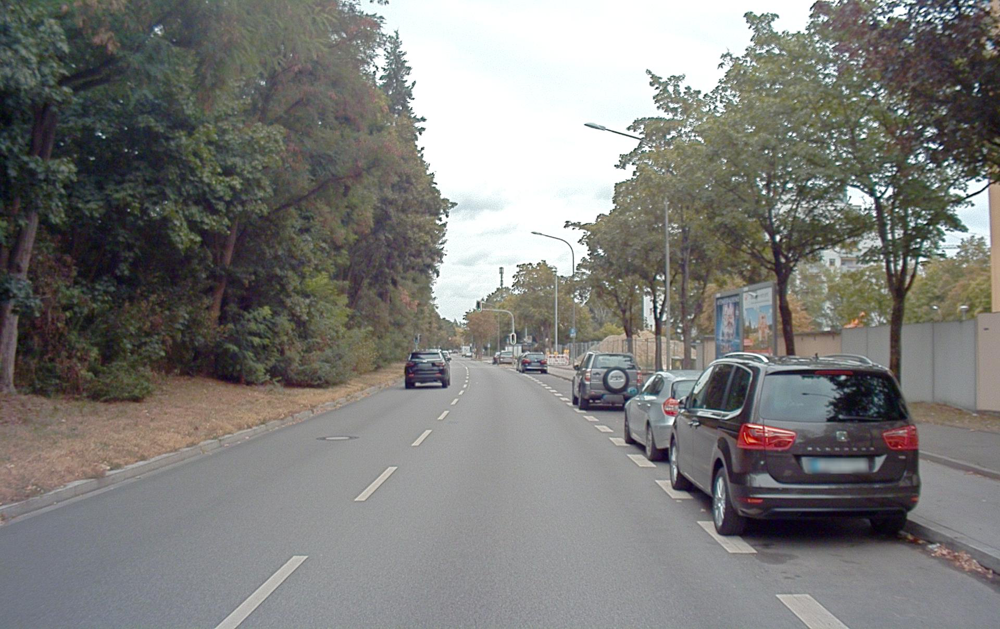

In [100]:
test_image


### Get and display prediction

In [101]:

pred = model(test_image)

In [102]:
boxes = get_boxes(pred.xyxy[0])

In [103]:
#return how many objects detected
(pred.xyxy[0]).shape[0]

7

In [104]:
pred.xyxy[0][0][0:4]

tensor([1279.73840,  674.37317, 1769.26367, 1033.05579])

In [105]:
image = np.array(test_image, dtype = 'uint8')
image.shape

(1208, 1920, 3)

In [106]:
get_box_classes(pred.xyxy[0])

array([2, 2, 2, 2, 2, 2, 2], dtype=uint8)

In [173]:
#Get image with bounding boxes drawn. Limit the type of class to cars (index 2)
output_image = draw_boxes(image, boxes, get_box_classes(pred.xyxy[0]), class_names, limit_classes = [2])

NA (1279, 674) (1769, 1033)
NA (1197, 707) (1348, 881)
NA (777, 672) (866, 746)
NA (1095, 668) (1234, 784)
NA (995, 675) (1049, 715)
NA (946, 670) (989, 701)
NA (1103, 683) (1330, 835)


In [174]:
output_image.shape

(1208, 1920, 3)

In [175]:
final = Image.fromarray(output_image)

In [176]:
final.size

(1920, 1208)

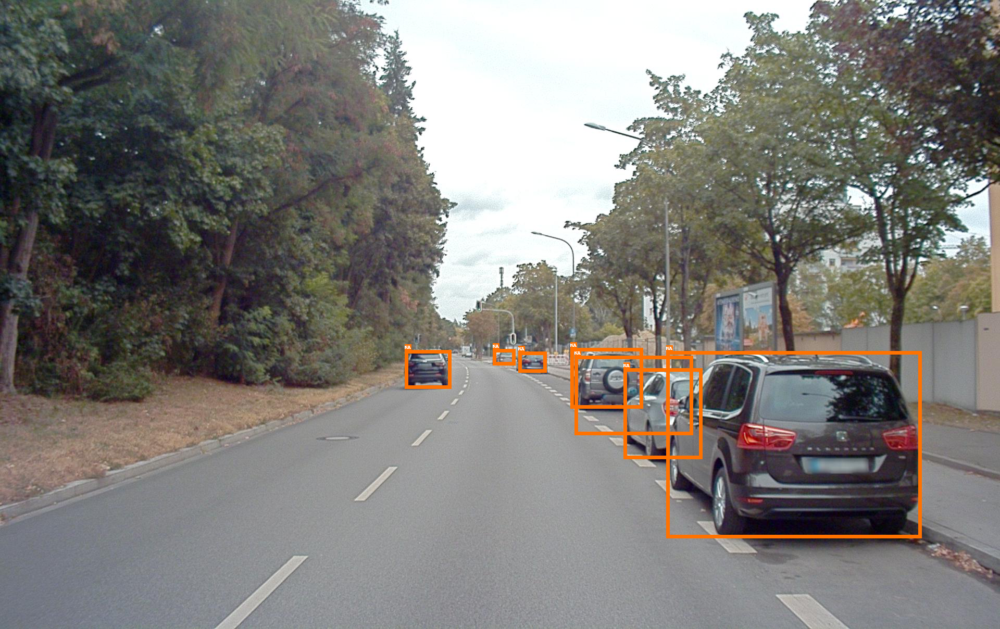

In [177]:
final

**The model does seem to detect the cars in the image. However we can see that it detected one too many cars**


## Test Performance on all test Data<a name='BigTest'>

Now that the model appears to be detecting cars, the model will be tested againt the entire A2D2 dataset. 


In [21]:
import tarfile
import json

In [22]:
#access the A2D2 data
filename = 'camera_lidar_semantic_bboxes.tar'
file_obj = tarfile.open(filename, "r")

In [23]:
#Get the list of image filenames and label filenames
with open("dash_cam_image_file_names.txt", "r") as f1:
    dash_cam_image_file_names = f1.readlines()
    
with open("dash_cam_label_file_names.txt", "r") as f2:
    dash_cam_label_file_names = f2.readlines()

In [165]:
def get_label_file_name(image_name):
    #returns the corresponding label file name
    name = image_name.replace("/camera", "/label3D")
    name = name.replace("_camera", "_label3D")
    name = name.replace(".png", ".json")
    return name

def iou(box1, box2):
    """Implement the intersection over union (IoU) between box1 and box2
    
    Arguments:
    box1 -- first box, list object with coordinates (box1_x1, box1_y1, box1_x2, box_1_y2)
    box2 -- second box, list object with coordinates (box2_x1, box2_y1, box2_x2, box2_y2)
    """

    (box1_x1, box1_y1, box1_x2, box1_y2) = box1
    (box2_x1, box2_y1, box2_x2, box2_y2) = box2
    
    # Calculate the (yi1, xi1, yi2, xi2) coordinates of the intersection of box1 and box2. Calculate its Area.
    xi1 = max(box1_x1, box2_x1)
    yi1 = max(box1_y1, box2_y1)
    xi2 = min(box1_x2, box2_x2)
    yi2 = min(box1_y2, box2_y2)
    inter_width = max(xi2 - xi1, 0)
    inter_height = max(yi2 - yi1, 0)
    inter_area = inter_width * inter_height
    
    # Calculate the Union area by using Formula: Union(A,B) = A + B - Inter(A,B)
    box1_area = (box1_x2 - box1_x1) * (box1_y2 - box1_y1)
    box2_area = (box2_x2 - box2_x1) * (box2_y2 - box2_y1)
    union_area = box1_area + box2_area - inter_area
    
    # compute the IoU
    iou = inter_area / union_area
    
    return iou

def match_boxes(box_list_1, box_list_2):
    """Find a one to one match of most similar boxes based on location
    
    Arguments:
    box_list_1 -- known list of list object with coordinates (boxi_x1, boxi_y1, boxi_x2, boxi_y2)
    box_list 2 -- predicted list of list object with coordinates (boxj_x1, boxj_y1, boxj_x2, boxj_y2)
    """
    def sort_horiz(array):
        boxes = array
        temp = []
        for box in boxes:
            temp.append(box[0])
            
        temp.sort()
        new_array = []
        
        for num in temp:
            for box in boxes:
                if np.any(box[0] == num):
                    new_array.append(box)
                    boxes.remove(box)
                    
        return new_array
    
    def sort_vert(array):
        boxes = array
        temp = []
        for box in boxes:
            temp.append(box[1])
            
        temp.sort()
        new_array = []
        
        for num in temp:
            for box in boxes:
                if np.any(box[1] == num):
                    new_array.append(box)
                    boxes.remove(box)
                    
        return new_array
    
    list_1 = sort_horiz(box_list_1)
    list_1 = sort_vert(list_1)
    
    list_2 = sort_vert(box_list_2)
    list_2 = sort_horiz(list_2)
            
    return zip(list_1, list_2)    
    
def iou_scores(test_image):
    """Calculates the intersection over union (IoU) for the test_image's given bounding boxes
    and the predicted bounding boxes
        
    Arguments:
    test_image -- test image file name
    """
    
    image = file_obj.extractfile(test_image)
    label_json = json.load(file_obj.extractfile(get_label_file_name(test_image)))
    
    known_boxes = []
    
    for key in label_json.keys():
        if label_json[key]['class'] in ['Car', 'VanSUV']:
            known_boxes.append(label_json[key]['2d_bbox'])
    
    image = Image.open(file_obj.extractfile(test_image))
    
    pred = model(image)
    prediction = np.array(pred.xyxy[0])
    
    image.close()
    
    pred_boxes = []
    pred_probs = []
    
    for i in prediction:
        if i[-1] == 2:
            pred_boxes.append(i[:4].tolist())
            pred_probs.append(i[4])
            
    num_known, num_pred = len(known_boxes), len(pred_boxes)
    
    if num_known == num_pred:
        temp = list(match_boxes(known_boxes, pred_boxes))
        scores = [iou(bb_box[0], bb_box[1]) for bb_box in temp]
        return scores, num_known, num_pred
    
    elif num_known < num_pred:
        all_scores = []
        scores = [0 for x in range(num_pred - num_known)]
        for i in pred_boxes:
            for j in known_boxes:
                all_scores.append(iou(i, j))
        for score in sorted(all_scores)[-(num_pred-num_known+1):]:
            scores.append(score)
        return scores, num_known, num_pred
    
    else:
        all_scores = []
        scores = []
        for i in pred_boxes:
            for j in known_boxes:
                all_scores.append(iou(i, j))
        for score in sorted(all_scores)[-(num_pred):]:
            scores.append(score)
        return scores, num_known, num_pred
    
   
        

In [166]:
all_scores = []
all_num_know = []
all_num_pred = []
for i in dash_cam_image_file_names:
    scores, num_known, num_pred = iou_scores(i[:-1])
    all_scores.append(scores)
    all_num_know.append(num_known)
    all_num_pred.append(num_pred)

In [167]:
len(all_scores)

12497

**Save the results to be analysed in another notebook**

In [170]:
import pickle

with open("iou-scores", "wb") as fp:   #Pickling
    pickle.dump(all_scores, fp)
    
with open("num-known", "wb") as fp:   #Pickling
    pickle.dump(all_num_know, fp)
    
with open("num-pred", "wb") as fp:   #Pickling
    pickle.dump(all_num_pred, fp)

#with open("iou-scores", "rb") as fp:   # Unpickling
#    all_scores = pickle.load(fp)

#with open("num-known", "rb") as fp:   # Unpickling
#    all_num_known = pickle.load(fp)

#with open("num=pred", "rb") as fp:   # Unpickling
#    all_Num_pred = pickle.load(fp)


## Classify a Single Car Image<a name='Car'>


### Crop car from image to classify

Crop one of the predictions from the original test image

In [32]:
car = test_image.crop(np.array(pred.xyxy[0][0][0:4], dtype='uint32'))

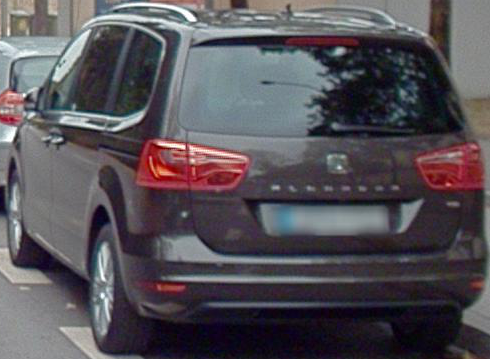

In [33]:
car

In [34]:
car.size

(490, 359)

In [24]:
car = car.save("E:\\A2D2/test_image.jpg")


### Feed Cropped Image into Classifier

In [55]:
import tensorflow as tf
from tensorflow import keras

car_model = keras.models.load_model("E:\\A2D2/EfficientNetCar.h5")

In [73]:
#function to prepare image for classification

def prepare_image(car_image):
    image = tf.image.resize(car_image, size=(224, 224))
    image = tf.cast(image, tf.float32) / 255.0
    return image
    
def make_square(im, min_size=256, fill_color=(0, 0, 0)):
    x, y = im.size
    size = max(min_size, x, y)
    new_im = Image.new('RGB', (size, size))
    new_im.paste(im, (int((size-x)/2), int((size-y)/2)))
    
    return new_im

In [74]:
square_car = make_square(car, fill_color = (255, 255, 255))

In [75]:
square_car.size

(490, 490)

In [76]:
im = prepare_image(np.array(square_car))

In [77]:
im.shape

TensorShape([224, 224, 3])

In [78]:
im = np.expand_dims(im, axis = 0)

In [79]:
im.shape

(1, 224, 224, 3)

In [80]:
pred = car_model.predict(im)

In [82]:
class_pred = np.argmax(pred)

In [92]:
with open ("all_car_classes.txt", "rb") as f:
    CLASSES = pickle.load(f)

In [190]:
CLASSES[class_pred]

'Ford_Focus'

## Putting it All Together<a name='Together'>
    
    Finally, a function is defined that combines both models and outputs the original image with bounding boxes and 
    predicted labels

In [210]:
def detector_classifier(detector_model, classifier_model, image):
    """Detect occurance of a particular object in an image then crop out the object to classify.
    
    Arguments:
    
    detection_model -- object detection model
    classifier_model -- image classification model
    image -- image to search
    """
    pred = detector_model(image)
    boxes = get_boxes(pred.xyxy[0])
    #image = np.array(image, dtype = 'uint8')
    
    car = image.crop(np.array(pred.xyxy[0][0][0:4], dtype='uint32'))
    square_car = make_square(car, fill_color = (255, 255, 255))
    im = prepare_image(np.array(square_car))
    im = np.expand_dims(im, axis = 0)
    
    preds = classifier_model.predict(im)
    class_pred = np.argmax(preds)
    image = np.array(image, dtype = 'uint8')
    output_image = draw_boxes(image, boxes, get_box_classes(pred.xyxy[0]), class_names, label = CLASSES[class_pred], limit_classes = [2])
    
    return output_image

In [211]:
output_image = detector_classifier(model, car_model, test_image)

Ford_Focus (1279, 674) (1769, 1033)
Ford_Focus (1197, 707) (1348, 881)
Ford_Focus (777, 672) (866, 746)
Ford_Focus (1095, 668) (1234, 784)
Ford_Focus (995, 675) (1049, 715)
Ford_Focus (946, 670) (989, 701)
Ford_Focus (1103, 683) (1330, 835)


In [213]:
output_image = Image.fromarray(output_image)

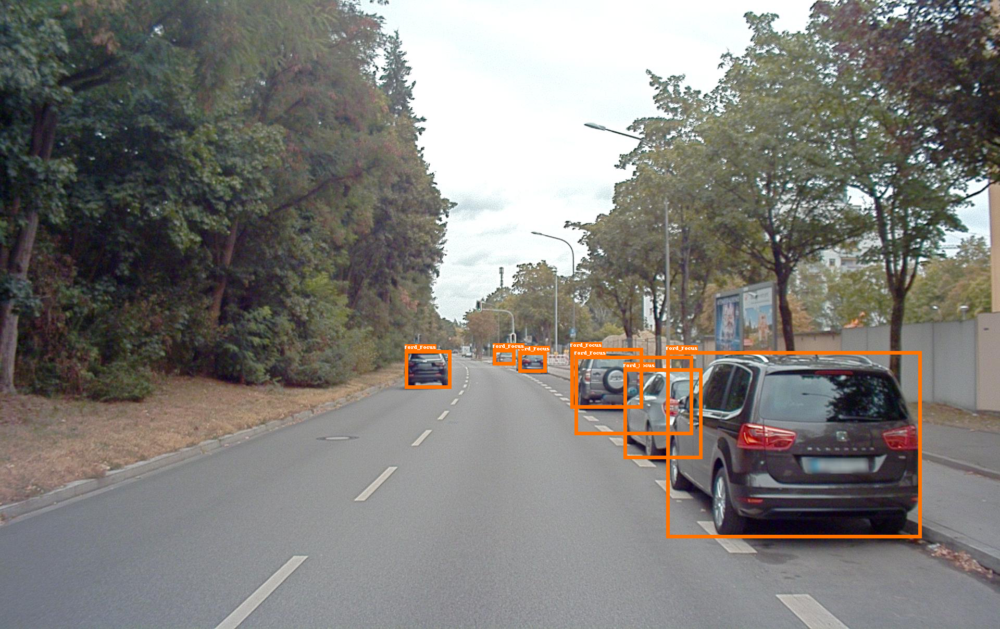

In [214]:
output_image


## Final Summary

The detector/classifier does operate as expected.However, although the detection phase seems to perform well, the classification phase does not. The car classifier predicts all cars to be a Ford Focus. This is undoubtedly due to the extremely unbalanced training data used. Additional work needs to be performed to improve the classification model. On the plus side, once the new and improved model is trained, it is a simple matter of uploading the weights to the detector/classifier. Furthermore, a different object can be selected ,other than "car", from the YOLO model and a purpose built classifier simply input into the detector/classifier function.

